# Exploratory data analysis and vizualizations

### Tasks:
<table width="100%" height="90%">
    <tr>
        <td width="10%">
        <img src="https://img.icons8.com/plasticine/2x/task.png" alt="Tasks" width="100" height="100" align="left">
        </td>
        <td style="text-align: left">
        <font size="3">1. Run this jupyter notebook step by step and try to understand what the script does.</font><br>
        <font size="3">2. Find one ore more new data sets (e.g. on Kaggle) and replace the car data set.</font><br>
        <font size="3">3. Repeat the exploratory data analysis and vizualizations based on the new data.</font><br>
        <font size="3">4. For spatial data analysis, replace the attribute 'residents_per_km2' by a new attribute.</font><br>
        <font size="3">5. Repeat the spatial data exploration based on the new attribute.</font><br>
        <br>
        <font size="3">Save the jupyter notebook with your solutions as html-file and upload it to Moodle.</font>
        </td>
    </tr>
</table>

### Importing the required libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns                       # visualisation
import matplotlib.pyplot as plt             # visualisation    
sns.set(color_codes=True)

import warnings
warnings.filterwarnings("ignore")


### Loading the data into a data frame

In [2]:
# Car dataset (source: https://www.kaggle.com/CooperUnion/cardataset)
df = pd.read_csv("data.csv")

# Shape (number of rows and columns)
print(df.shape)

# To display the top 5 rows 
df.head(5)
# df.tail(5)


(11914, 16)


,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


### Checking the data types

In [3]:
df.dtypes


Make                  object
Model                 object
Year                   int64
Engine Fuel Type      object
Engine HP            float64
Engine Cylinders     float64
Transmission Type     object
Driven_Wheels         object
Number of Doors      float64
Market Category       object
Vehicle Size          object
Vehicle Style         object
highway MPG            int64
city mpg               int64
Popularity             int64
MSRP                   int64
dtype: object

### Dropping the irrelevant columns

In [4]:
df = df.drop(['Engine Fuel Type', 'Market Category', 'Popularity', 'Number of Doors', 'Vehicle Size'], axis=1)
df.head(5)


,Make,Model,Year,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Vehicle Style,highway MPG,city mpg,MSRP
0,BMW,1 Series M,2011,335.0,6.0,MANUAL,rear wheel drive,Coupe,26,19,46135
1,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Convertible,28,19,40650
2,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Coupe,28,20,36350
3,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Coupe,28,18,29450
4,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Convertible,28,18,34500


### Renaming the columns

In [5]:
df = df.rename(columns={"Engine HP": "HP", "Engine Cylinders": "Cylinders", "Transmission Type": "Transmission", "Driven_Wheels": "Drive Mode","Vehicle Style": "Vehicle_Style", "highway MPG": "MPG-H", "city mpg": "MPG-C", "MSRP": "Price" })
df.head(5)

,Make,Model,Year,HP,Cylinders,Transmission,Drive Mode,Vehicle_Style,MPG-H,MPG-C,Price
0,BMW,1 Series M,2011,335.0,6.0,MANUAL,rear wheel drive,Coupe,26,19,46135
1,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Convertible,28,19,40650
2,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Coupe,28,20,36350
3,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Coupe,28,18,29450
4,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Convertible,28,18,34500


### Dropping the duplicate rows

In [6]:
# Number of rows and columns
df.shape


(11914, 11)

In [7]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)


number of duplicate rows:  (803, 11)


In [8]:
# Number of rows
df.count()


Make             11914
Model            11914
Year             11914
HP               11845
Cylinders        11884
Transmission     11914
Drive Mode       11914
Vehicle_Style    11914
MPG-H            11914
MPG-C            11914
Price            11914
dtype: int64

In [9]:
# Remove duplicates
df = df.drop_duplicates()
df.head(5)


,Make,Model,Year,HP,Cylinders,Transmission,Drive Mode,Vehicle_Style,MPG-H,MPG-C,Price
0,BMW,1 Series M,2011,335.0,6.0,MANUAL,rear wheel drive,Coupe,26,19,46135
1,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Convertible,28,19,40650
2,BMW,1 Series,2011,300.0,6.0,MANUAL,rear wheel drive,Coupe,28,20,36350
3,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Coupe,28,18,29450
4,BMW,1 Series,2011,230.0,6.0,MANUAL,rear wheel drive,Convertible,28,18,34500


In [10]:
df.count()


Make             11111
Model            11111
Year             11111
HP               11042
Cylinders        11081
Transmission     11111
Drive Mode       11111
Vehicle_Style    11111
MPG-H            11111
MPG-C            11111
Price            11111
dtype: int64

### Counting and dropping the missing values

In [11]:
# Showing the missing values
print(df.isna().sum())


Make              0
Model             0
Year              0
HP               69
Cylinders        30
Transmission      0
Drive Mode        0
Vehicle_Style     0
MPG-H             0
MPG-C             0
Price             0
dtype: int64


In [12]:
# Dropping the missing values
df = df.dropna()
df.count()


Make             11013
Model            11013
Year             11013
HP               11013
Cylinders        11013
Transmission     11013
Drive Mode       11013
Vehicle_Style    11013
MPG-H            11013
MPG-C            11013
Price            11013
dtype: int64

In [13]:
# After dropping the missing values
print(df.isna().sum())


Make             0
Model            0
Year             0
HP               0
Cylinders        0
Transmission     0
Drive Mode       0
Vehicle_Style    0
MPG-H            0
MPG-C            0
Price            0
dtype: int64


### Showing summary statistics of (cleaned up) variables

In [14]:
df.describe()


,Year,HP,Cylinders,MPG-H,MPG-C,Price
count,11013.000000,11013.000000,11013.000000,11013.000000,11013.000000,1.101300e+04
mean,2010.675384,252.734950,5.673749,26.333697,19.343957,4.191293e+04
std,7.239146,110.016458,1.764123,7.472912,6.609064,6.195408e+04
min,1990.000000,55.000000,0.000000,12.000000,7.000000,2.000000e+03
25%,2007.000000,171.000000,4.000000,22.000000,16.000000,2.149500e+04
50%,2015.000000,237.000000,6.000000,25.000000,18.000000,3.051000e+04
75%,2016.000000,302.000000,6.000000,30.000000,22.000000,4.295000e+04
max,2017.000000,1001.000000,16.000000,354.000000,137.000000,2.065902e+06


### Using boxplots for outlier detection 

<AxesSubplot:xlabel='Price'>

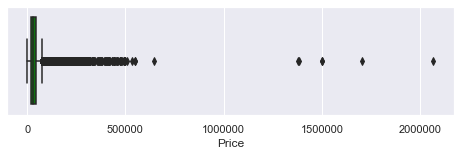

In [15]:
# Boxplot showing prices of cars
plt.figure(figsize=(8,2))
plt.ticklabel_format(style='plain')
sns.boxplot(x=df['Price'], color="green")


In [16]:
# Take a closer look at the very expansive cars
df[df.Price >= 500000]


,Make,Model,Year,HP,Cylinders,Transmission,Drive Mode,Vehicle_Style,MPG-H,MPG-C,Price
698,Maybach,62,2010,631.0,12.0,AUTOMATIC,rear wheel drive,Sedan,16,10,506500
1622,Lamborghini,Aventador,2014,720.0,12.0,AUTOMATED_MANUAL,all wheel drive,Convertible,16,10,548800
1626,Lamborghini,Aventador,2015,720.0,12.0,AUTOMATED_MANUAL,all wheel drive,Convertible,16,10,548800
1629,Lamborghini,Aventador,2016,750.0,12.0,AUTOMATED_MANUAL,all wheel drive,Convertible,18,11,535500
4024,Ferrari,Enzo,2003,660.0,12.0,AUTOMATED_MANUAL,rear wheel drive,Coupe,12,7,643330
6350,Maybach,Landaulet,2011,620.0,12.0,AUTOMATIC,rear wheel drive,Convertible,16,10,1380000
6351,Maybach,Landaulet,2012,620.0,12.0,AUTOMATIC,rear wheel drive,Convertible,16,10,1382750
8486,Lamborghini,Reventon,2008,650.0,12.0,AUTOMATED_MANUAL,all wheel drive,Coupe,14,9,1500000
11362,Bugatti,Veyron 16.4,2008,1001.0,16.0,AUTOMATED_MANUAL,all wheel drive,Coupe,14,8,2065902
11363,Bugatti,Veyron 16.4,2008,1001.0,16.0,AUTOMATED_MANUAL,all wheel drive,Coupe,14,8,1500000


<AxesSubplot:xlabel='HP'>

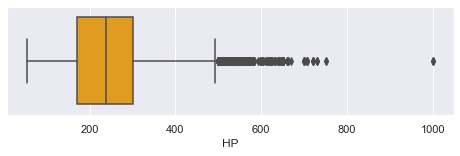

In [17]:
# Boxplot showing horse power of cars (HP)
plt.figure(figsize=(8,2))
sns.boxplot(x=df['HP'], color="orange")


In [18]:
# Take a closer look at the cars with very high horse power
df[df.HP >= 600]


,Make,Model,Year,HP,Cylinders,Transmission,Drive Mode,Vehicle_Style,MPG-H,MPG-C,Price
612,Maybach,57,2010,631.0,12.0,AUTOMATIC,rear wheel drive,Sedan,16,10,455500
613,Maybach,57,2010,604.0,12.0,AUTOMATIC,rear wheel drive,Sedan,16,10,405500
615,Maybach,57,2011,620.0,12.0,AUTOMATIC,rear wheel drive,Sedan,16,10,412000
617,Maybach,57,2012,620.0,12.0,AUTOMATIC,rear wheel drive,Sedan,16,10,418950
618,Ferrari,599,2009,611.0,12.0,AUTOMATED_MANUAL,rear wheel drive,Coupe,15,11,320580
...,...,...,...,...,...,...,...,...,...,...,...
11391,Dodge,Viper,2017,645.0,10.0,MANUAL,rear wheel drive,Coupe,19,12,118795
11393,Dodge,Viper,2017,645.0,10.0,MANUAL,rear wheel drive,Coupe,19,12,107995
11448,Rolls-Royce,Wraith,2014,624.0,12.0,AUTOMATIC,rear wheel drive,Coupe,21,13,284900
11449,Rolls-Royce,Wraith,2015,624.0,12.0,AUTOMATIC,rear wheel drive,Coupe,21,13,294025


### Calculate quantiles to obtain information about the distribution of each variable 

In [19]:
Q1 = df.quantile(0.25)
Q2 = df.quantile(0.50)
Q3 = df.quantile(0.75)
print(Q1)
print("---------------------------")
print(Q2)
print("---------------------------")
print(Q3)


Year          2007.0
HP             171.0
Cylinders        4.0
MPG-H           22.0
MPG-C           16.0
Price        21495.0
Name: 0.25, dtype: float64
---------------------------
Year          2015.0
HP             237.0
Cylinders        6.0
MPG-H           25.0
MPG-C           18.0
Price        30510.0
Name: 0.5, dtype: float64
---------------------------
Year          2016.0
HP             302.0
Cylinders        6.0
MPG-H           30.0
MPG-C           22.0
Price        42950.0
Name: 0.75, dtype: float64


### Plotting a histogram to show the distribution of a variable

Mean of HP: 252
Median of HP: 237


Text(0.5, 1.0, 'Histogram of Horse Power')

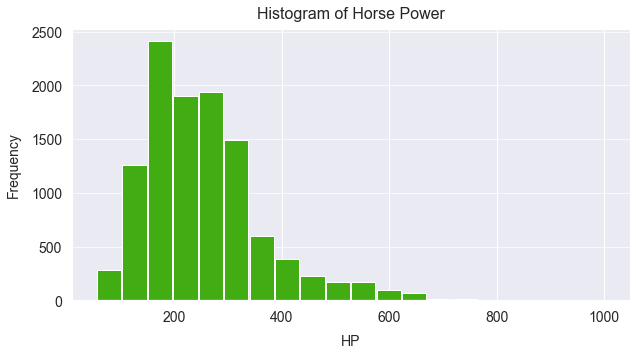

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Mean and Median HP
print('Mean of HP: ' +str(int(np.mean(df['HP']))))
print('Median of HP: ' +str(int(np.median(df['HP']))))

# Plot Histogram
fig = plt.figure( figsize=(10,5) )
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)
n, bins, patches = plt.hist(x=df['HP'], 
                            bins=20, 
                            color='#42AD12',
                            alpha=1, 
                            rwidth=0.95
                   )
plt.grid(True)
plt.ticklabel_format(style='plain')
plt.grid(axis='y', alpha=0.75)
plt.xlabel('HP', fontsize=14, labelpad=10)
plt.ylabel('Frequency', fontsize=14, labelpad=10)
plt.title('Histogram of Horse Power', fontsize=16, pad=10)


### Using a density plot to show the distribution of a variable

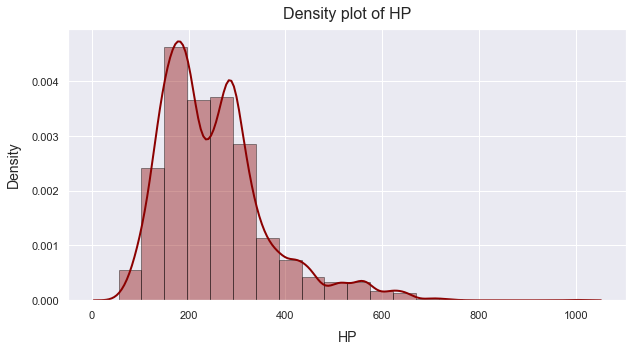

In [21]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['HP'], 
             hist=True, 
             kde=True, 
             bins=20, 
             color = 'darkred',
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 2},
            )
plt.title('Density plot of HP', fontsize=16, pad=10)
plt.xlabel('HP', fontsize=14, labelpad=10)
plt.ylabel('Density', fontsize=14, labelpad=10)
plt.grid(True)
plt.show()


### Plotting a barchart to show the number of observations per category

Text(0, 0.5, 'Make')

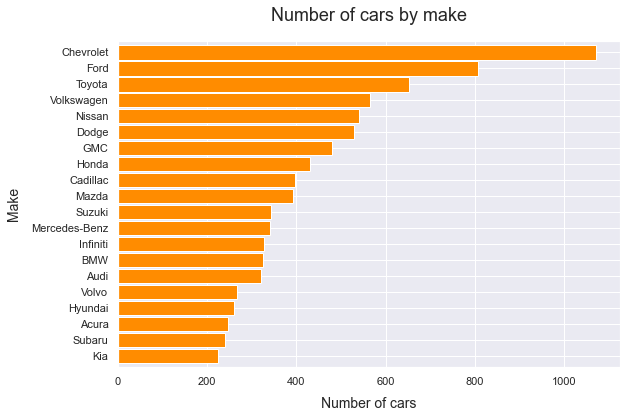

In [22]:
df.Make.value_counts().nlargest(20).sort_values(ascending=True).plot(kind='barh', width=0.9, figsize=(9,6), color="darkorange")
plt.title("Number of cars by make", fontsize=18, pad=20)
plt.xlabel('Number of cars', fontsize=14, labelpad=10)
plt.ylabel('Make', fontsize=14, labelpad=10)


### Using a scatterplot to explore the relationship between two variables

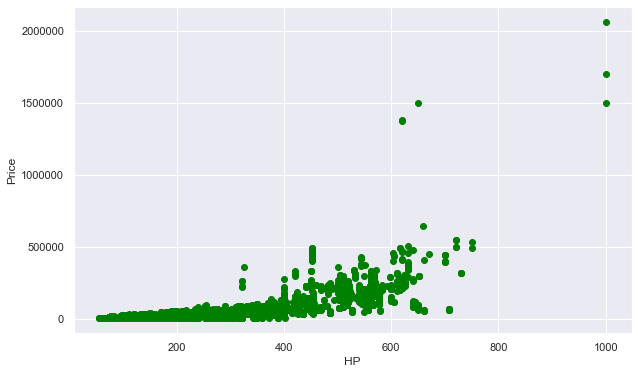

In [23]:
fig, ax = plt.subplots(figsize=(10,6))
plt.ticklabel_format(style='plain')
ax.scatter(df['HP'], df['Price'], color="green", alpha=1.0)
ax.set_xlabel('HP')
ax.set_ylabel('Price')
plt.show()


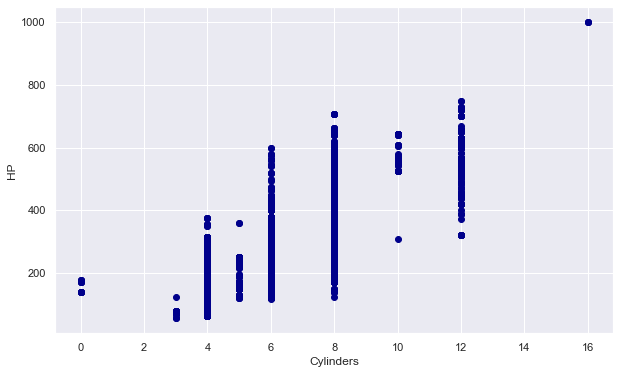

In [24]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['Cylinders'], df['HP'], color="darkblue", alpha=1.0)
ax.set_xlabel('Cylinders')
ax.set_ylabel('HP')
plt.show()


### Using a scatterplot-matrix to explore the relationships between more than two variables

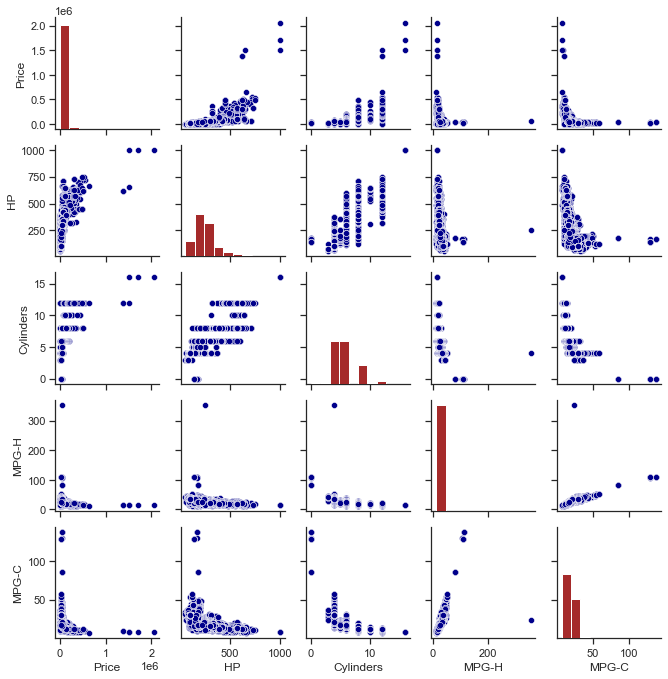

In [25]:
import seaborn as sns
sns.set(style="ticks")

g = sns.PairGrid(df[['Price','HP','Cylinders', 'MPG-H', 'MPG-C']], height=1.9, aspect=1)
g.map_upper(sns.scatterplot,color='darkblue')
g.map_lower(sns.scatterplot, color='darkblue')
g.map_diag(plt.hist, color='brown')


### Using a heat map to show the relationships between more than two variables

,Year,HP,Cylinders,MPG-H,MPG-C,Price
Year,1.000000,0.333384,-0.032044,0.271049,0.224081,0.208555
HP,0.333384,1.000000,0.787238,-0.419839,-0.472138,0.661486
Cylinders,-0.032044,0.787238,1.000000,-0.611203,-0.631906,0.555412
MPG-H,0.271049,-0.419839,-0.611203,1.000000,0.841808,-0.209174
MPG-C,0.224081,-0.472138,-0.631906,0.841808,1.000000,-0.233739
Price,0.208555,0.661486,0.555412,-0.209174,-0.233739,1.000000


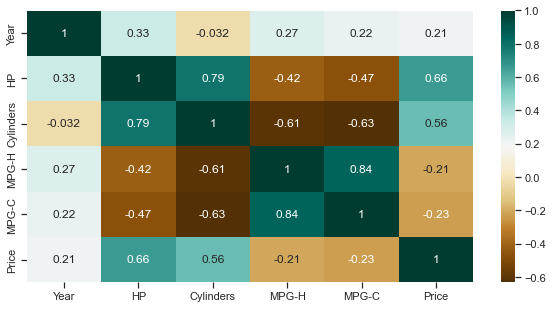

In [26]:
plt.figure(figsize=(10,5))
c = df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c


### Using bubble plots to vizualize data 

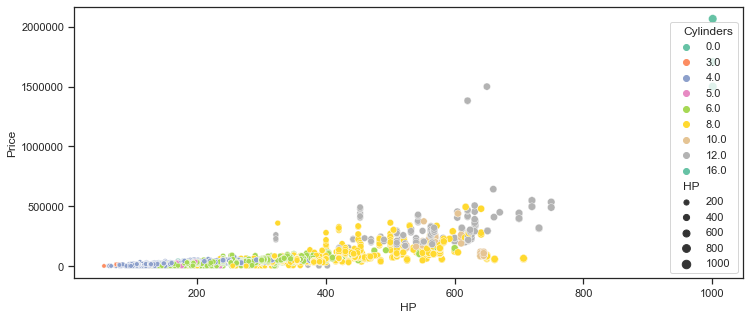

In [27]:
plt.figure(figsize=(12,5))
plt.ticklabel_format(style='plain')
cmap = sns.cubehelix_palette(dark=.3, light=3, as_cmap=True)
ax = sns.scatterplot(x="HP", 
                     y="Price",
                     size="HP",
                     hue="Cylinders",
                     palette="Set2",
                     data=df)


### Radar chart to vizualize data

In [28]:
# Libraries
import plotly.express as px
import pandas as pd

df_sub    = df[['Vehicle_Style','HP']]
df_sub_02 = df_sub.groupby(df_sub['Vehicle_Style']).mean()
df_sub_02

fig = px.line_polar(df_sub_02, r='HP', 
                    theta=df_sub_02.index, 
                    line_close=True
                   )
fig.update_traces(fill='toself')
fig.update_layout(width=500,height=500)
fig.show()


## Exploring spatial data

### Importing and exploring polygon-map in geojson format

In [29]:
import os
import geopandas as pd

# Polygonmap as .json-File
polys = pd.read_file("swissBOUNDARIES3D_1_3_TLM_KANTONSGEBIET.shp")

# Show data structure and first records
print("nrows, ncols", polys.shape)
print("-------------------------------------------------------")
print("Type:", type(polys))


nrows, ncols (50, 21)
-------------------------------------------------------
Type: <class 'geopandas.geodataframe.GeoDataFrame'>


In [30]:
# Object is GeoDataFrame (includes geometry of polygons)
polys


,UUID,DATUM_AEND,DATUM_ERST,ERSTELL_J,ERSTELL_M,REVISION_J,REVISION_M,GRUND_AEND,HERKUNFT,HERKUNFT_J,...,OBJEKTART,REVISION_Q,ICC,KANTONSNUM,SEE_FLAECH,KANTONSFLA,KT_TEIL,NAME,EINWOHNERZ,geometry
0,{0B2364ED-49E0-4D53-A33C-C684DD530B57},2018-11-22,2012-10-26,2012,10,2022,5,Verbessert,AV,2019,...,Kanton,2021_Aufbau,CH,18,NaN,710530.0,0,Graubünden,200096.0,"POLYGON Z ((2735215.665 1194955.161 2870.714, ..."
1,{DDD56CEF-0E61-4EED-85ED-F67A459C93ED},2021-11-02,2012-10-26,2012,10,2022,5,Verbessert,AV,2021,...,Kanton,2021_Aufbau,CH,2,11897.0,595850.0,1,Bern,1043081.0,"POLYGON Z ((2595241.510 1169313.282 2090.846, ..."
2,{54B25E50-30A7-4995-ADE3-5FFF6E13A995},2018-11-22,2012-10-26,2012,10,2022,5,Verbessert,AV,2019,...,Kanton,2021_Aufbau,CH,23,1060.0,522463.0,0,Valais,348503.0,"POLYGON Z ((2601807.628 1136116.777 2948.413, ..."
3,{921DFEF2-6D91-4CB8-9CFC-2A831C412020},2019-11-06,2012-10-26,2012,10,2022,5,Verbessert,swisstopo,2019,...,Kanton,2021_Aufbau,CH,22,39097.0,321202.0,1,Vaud,814762.0,"POLYGON Z ((2555092.813 1138713.419 372.133, 2..."
4,{95F10F52-8B2F-4D6A-AF7E-D4F915E42F89},2020-11-19,2012-10-26,2012,10,2022,5,Verbessert,AV,2020,...,Kanton,2021_Aufbau,CH,21,7147.0,281215.0,0,Ticino,350986.0,"POLYGON Z ((2727358.511 1119219.094 1351.527, ..."
5,{05D55405-466B-4ECC-83C7-A906DEB0D607},2017-12-04,2012-10-26,2012,10,2022,5,Verbessert,swisstopo,2018,...,Kanton,2021_Aufbau,CH,17,7720.0,202820.0,1,St. Gallen,514504.0,"POLYGON Z ((2716175.426 1240719.199 835.055, 2..."
6,{FB7105B8-6D7C-4787-846E-17B2BC145C6E},2018-11-22,2012-10-26,2012,10,2022,5,Verbessert,AV,2019,...,Kanton,2021_Aufbau,CH,1,6811.0,172894.0,0,Zürich,1553423.0,"POLYGON Z ((2702665.218 1273942.679 488.535, 2..."
7,{B01E1FB4-9A9B-48AC-BCA3-7D6D93BA23F3},2021-11-02,2012-10-26,2012,10,2022,5,Verbessert,AV,2021,...,Kanton,2021_Aufbau,CH,10,7818.0,167243.0,1,Fribourg,325547.0,"POLYGON Z ((2558191.551 1156584.231 799.676, 2..."
8,{A7C284E4-45C4-44E2-ABAF-D1A0EAB10397},2019-11-06,2012-10-26,2012,10,2022,5,Verbessert,swisstopo,2019,...,Kanton,2021_Aufbau,CH,3,6438.0,149352.0,0,Luzern,416347.0,"POLYGON Z ((2633539.367 1225116.817 546.601, 2..."
9,{E11CD2CA-2E2D-415C-8789-C10D7C26E441},2016-12-09,2012-10-26,2012,10,2022,5,Verbessert,swisstopo,2017,...,Kanton,2021_Aufbau,CH,19,870.0,140380.0,1,Aargau,694072.0,"POLYGON Z ((2655848.686 1230370.051 657.012, 2..."


#### Plotting the map

In [31]:
import folium 
import pyproj

# Initializing the map
m = folium.Map(location=[47.44, 8.65], zoom_start=10)

# Map settings
folium.Choropleth(
    geo_data=polys,
    name='polys',
    fill_color='yellow'
).add_to(m)

folium.LayerControl().add_to(m)

# Plot map
m


#### Plotting a subset of the map

In [32]:
# Subset of map with index
idx = polys[polys['NAME'] == 'Winterthur'].index[0]
polys.iloc[[idx]]


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
# Plot subset of map
import folium 
import numpy as np

# Initializing the map
m     = folium.Map(location=[47.44, 8.65], zoom_start=10)

# Map settings
folium.Choropleth(
    geo_data=polys.iloc[[idx]],
    name='polys',
    fill_color='yellow'
).add_to(m)

folium.LayerControl().add_to(m)

# Plot map
m


### Importing and exploring attribute data

In [ ]:
import pandas as pd
data = pd.read_excel('municipalities_kt_zh_data.xlsx', index_col=None)

print(type(data))

data.head(5)


In [ ]:
data.describe()


### Scatterplot matrix of attribute data

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="ticks")

g = sns.PairGrid(data[['residents', 'percentage_foreigners', 'residents_per_km2']], height=2.5, aspect=1)
g.map_upper(sns.scatterplot,color='darkgreen')
g.map_lower(sns.scatterplot, color='darkgreen')
g.map_diag(plt.hist, color='orange')


### Using a choropleth map to explore the spatial pattern of a variable

In [ ]:
import folium 
from folium.folium import Map
import pandas as pd
import branca.colormap as cm
from IPython.display import HTML

# Function for hiding original legend
def folium_del_legend(choropleth: folium.Choropleth):
    del_list = []
    for child in choropleth._children:
        if child.startswith('color_map'):
            del_list.append(child)
            for del_item in del_list:
                choropleth._children.pop(del_item)
                return choropleth

# Geojson and data
polys = 'GEN_A4_GEMEINDEN_2019_epsg4326.json'
data  = pd.read_excel('municipalities_kt_zh_data.xlsx')

# Bins for color-range of the map
bins = list(data['residents_per_km2'].quantile([0.00, 0.25, 0.50, 0.75, 1.00]))

# Initializing the map
m = folium.Map(tiles='OpenStreetMap', location=[47.44, 8.65], zoom_start=10)

# Map-Settings
folium.Choropleth(
        geo_data=polys,
        name='choropleth',
        data=data,
        columns=['BFS', 'residents_per_km2'],
        key_on='feature.properties.BFS',
        fill_color='RdGy',
        fill_opacity=0.7,
        line_opacity=0.5,
        legend_name='Number of residents',
        bins=bins,
        reset=True
).add_to(m)

# Layer controls
folium.LayerControl(collapsed=True).add_to(m)

# Plot map
m

# Save map as HTML
# m.save('map.html')


### Further readings and tips

#### Seaborn:
https://jakevdp.github.io/PythonDataScienceHandbook/04.14-visualization-with-seaborn.html

#### Matplotlib:
https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/

#### Exploratory data analysis
https://towardsdatascience.com/15-data-exploration-techniques-to-go-from-data-to-insights-93f66e6805df

#### Spatial data and maps:
https://ipyleaflet.readthedocs.io/en/latest/

https://python-visualization.github.io/folium/quickstart.html

https://deparkes.co.uk/2016/06/10/folium-map-tiles/

https://nbviewer.jupyter.org/gist/talbertc-usgs/18f8901fc98f109f2b71156cf3ac81cd

https://www.nagarajbhat.com/post/folium-visualization

https://ocefpaf.github.io/python4oceanographers/blog/2015/03/23/wms_layers/